In [7]:
# ! pip install plotly

In [24]:
#Importing Libraries
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

In [18]:
# Load the dataset
wine=pd.read_csv('wine.csv')

In [19]:
#Understand data
print(wine.head())
print(wine.shape)

   fixed.acidity  volatile.acidity  citric.acid  residual.sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free.sulfur.dioxide  total.sulfur.dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality color  
0      9.4        5   red  
1      9.8        5   red  
2 

In [20]:
#Seperate features and color/quality rating
chemical=wine.iloc[:,:-2] # Only chemical properties(Taking out labels & rating)
labels=wine['color'] # Color of the wine
quality=wine['quality']

In [21]:
#Understanding what variables make a wine red or white
average_by_color = wine.groupby('color').mean()
average_by_color

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
color,,,,,,,,,,,,
red,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
white,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909


#### Using mean of features to understand how features contribute to Red/White wine

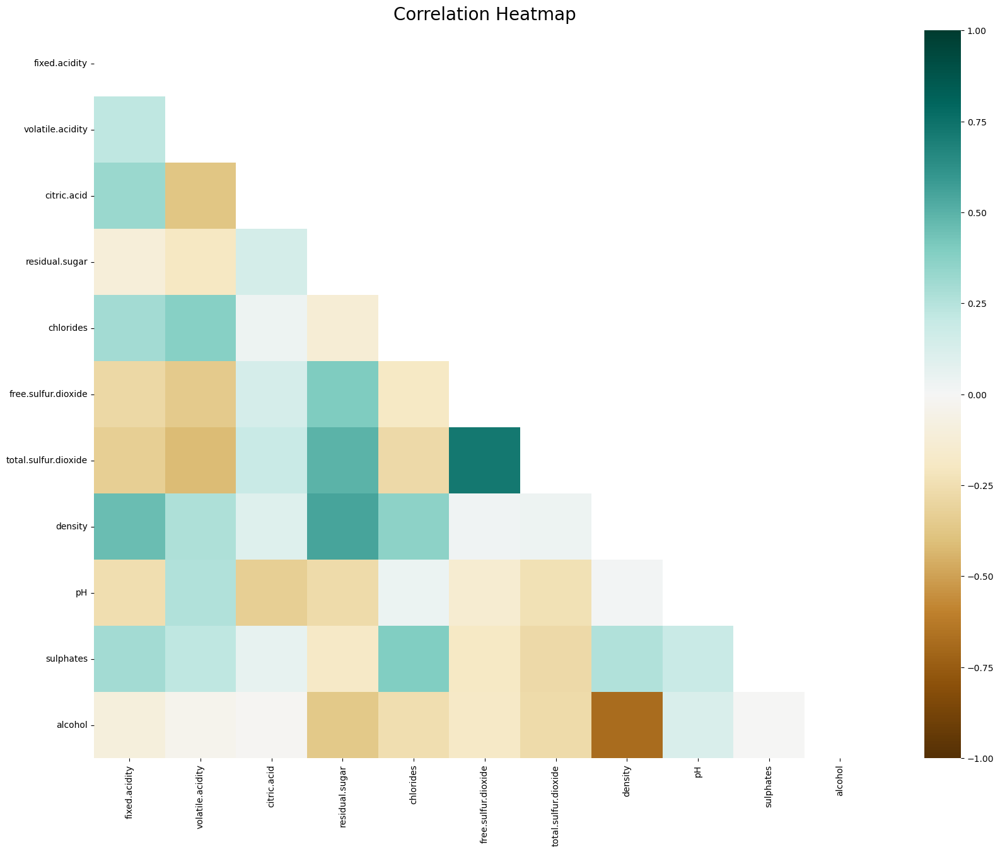

In [22]:
# plot correlation matrix of all columns in the dataset
plt.figure(figsize=(20,15)) # set figure size for plotting
mask = np.triu(np.ones_like(chemical.corr(), dtype=bool)) # initialize mask to hide the upper triangle
heatmap = sns.heatmap(chemical.corr(), mask=mask, vmin=-1, vmax=1, cmap='BrBG') # plot heatmap of correlations
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':20}, pad=12) # title of the heatmap
plt.show()

#### To better understand the matrix let's run a hierarchial cluster on it

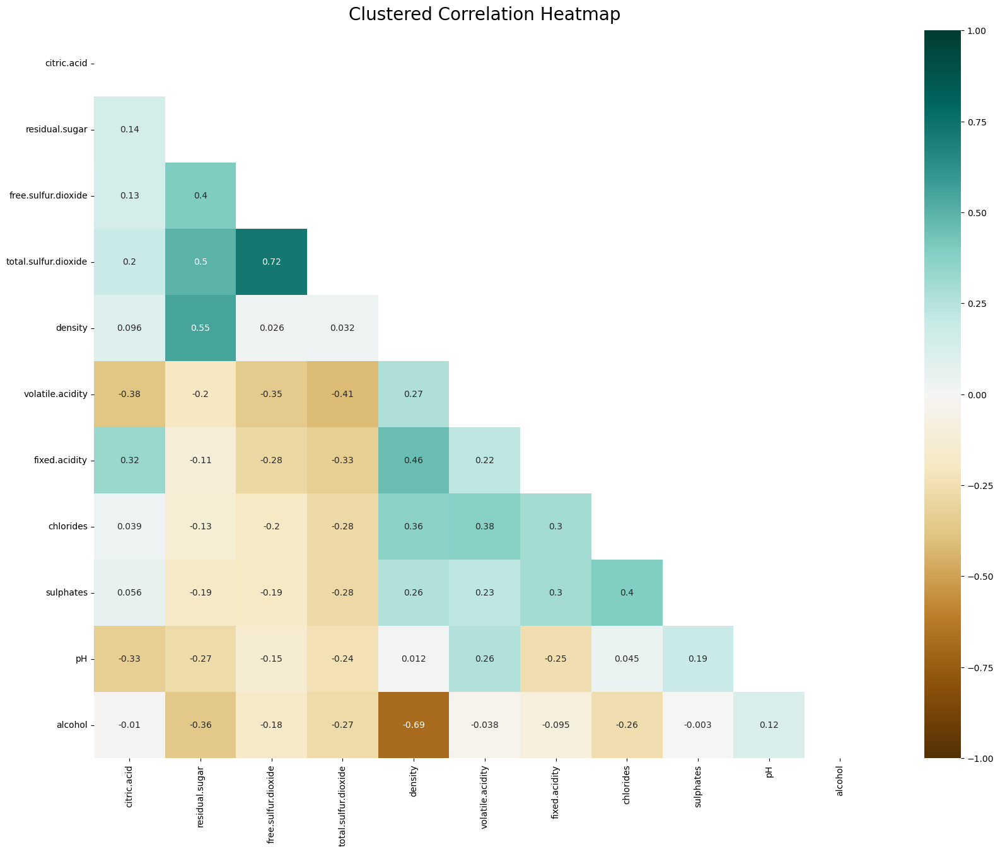

In [26]:

# Calculate the correlation matrix
corr_matrix = chemical.corr()

# Perform hierarchical clustering on the correlation matrix
# 'average' linkage is used here, but you can try others like 'complete', 'single', etc.
linkage_matrix = linkage(corr_matrix, method='average')

# Get the order of columns after clustering
clustered_order = leaves_list(linkage_matrix)

# Reorder the correlation matrix based on the clustering
clustered_corr_matrix = corr_matrix.iloc[clustered_order, clustered_order]

# Plot the clustered correlation matrix as a heatmap
plt.figure(figsize=(20, 15))
mask = np.triu(np.ones_like(clustered_corr_matrix, dtype=bool))  # Mask the upper triangle
heatmap = sns.heatmap(clustered_corr_matrix, mask=mask, vmin=-1, vmax=1, cmap='BrBG', annot=True)
heatmap.set_title('Clustered Correlation Heatmap', fontdict={'fontsize':20}, pad=12)
plt.show()

#### Here we can see three clusters two large ones yellow and green and a green one on the top left. To understand the chemistry of wine features creating a dendrogram

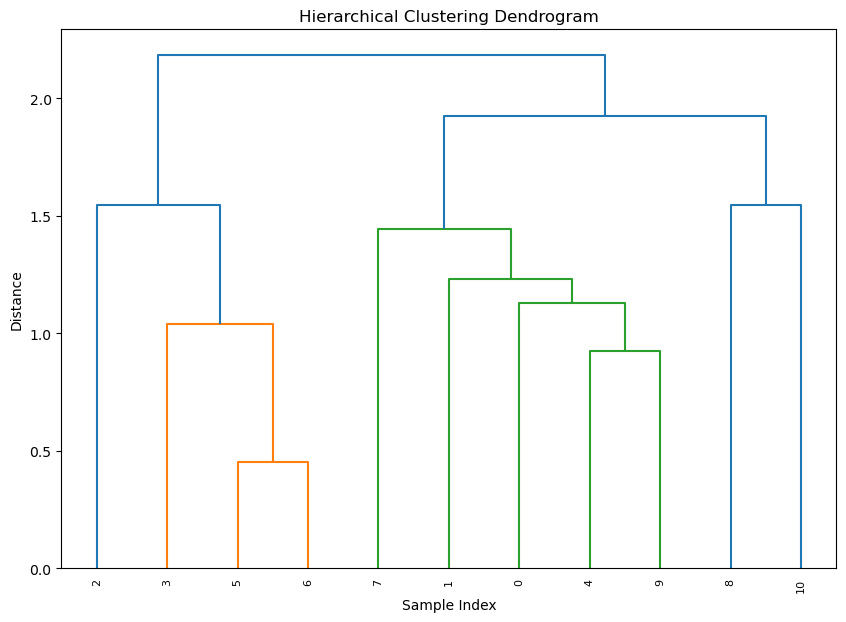

In [27]:
# Plot the dendrogram
plt.figure(figsize=(10, 7))
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Sample Index")
plt.ylabel("Distance")

# Dendrogram function to plot the hierarchical clustering
dendrogram(linkage_matrix, leaf_rotation=90., leaf_font_size=8., color_threshold=0.7*max(linkage_matrix[:, 2]))

plt.show()

In [28]:
clustered_order

array([ 2,  3,  5,  6,  7,  1,  0,  4,  9,  8, 10], dtype=int32)

#### 2,  3,  5, and 6 are similar to the mean we saw earlier indicating white wine. 7,  1,  0,  4, and 9 they indicated red wine.

In [29]:
#Scaling the features for dimension reduction
scaler= StandardScaler()
chemical_scaled=scaler.fit_transform(chemical)

In [30]:
# Head of standardised features
print(pd.DataFrame(chemical_scaled, columns=chemical.columns).head())

   fixed.acidity  volatile.acidity  citric.acid  residual.sugar  chlorides  \
0       0.142473          2.188833    -2.192833       -0.744778   0.569958   
1       0.451036          3.282235    -2.192833       -0.597640   1.197975   
2       0.451036          2.553300    -1.917553       -0.660699   1.026697   
3       3.073817         -0.362438     1.661085       -0.744778   0.541412   
4       0.142473          2.188833    -2.192833       -0.744778   0.569958   

   free.sulfur.dioxide  total.sulfur.dioxide   density        pH  sulphates  \
0            -1.100140             -1.446359  1.034993  1.813090   0.193097   
1            -0.311320             -0.862469  0.701486 -0.115073   0.999579   
2            -0.874763             -1.092486  0.768188  0.258120   0.797958   
3            -0.762074             -0.986324  1.101694 -0.363868   0.327510   
4            -1.100140             -1.446359  1.034993  1.813090   0.193097   

    alcohol  
0 -0.915464  
1 -0.580068  
2 -0.580068  


In [31]:
# Principal Component Analysis (PCA)
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

#### Randomly using ncomponents as 2

In [32]:
#Perform PCA
pca=PCA(n_components=2) #Capture 2 components
chemical_pca=pca.fit_transform(chemical_scaled)

In [33]:
#Dataframe with PCA results
pca_df=pd.DataFrame(data=chemical_pca,columns=['PC1','PC2'])
pca_df['color']=labels #Add color & quality back to pca dataframe
pca_df['quality']=quality

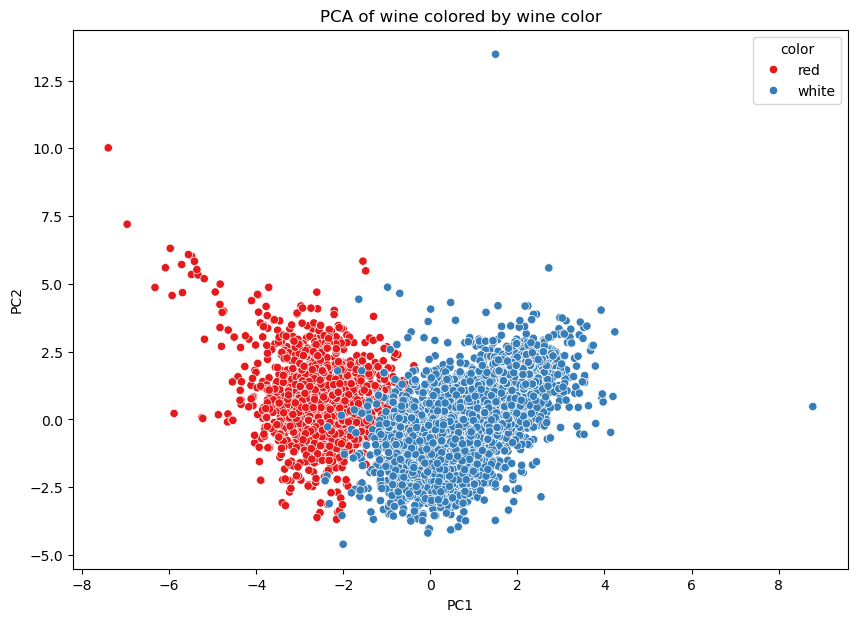

In [34]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='PC1',y='PC2',hue='color',data=pca_df,palette='Set1')
plt.title("PCA of wine colored by wine color")
plt.show()

#### Two principal components are almost able to divide the data into two clusters. But there is some overlap. Let's use plots to find ideal number of components

In [35]:
#Trial 2
#Perform PCA
pca=PCA(n_components=5) #Capture 2 components
chemical_pca=pca.fit_transform(chemical_scaled)
#Dataframe with PCA results
pca_df1=pd.DataFrame(data=chemical_pca,columns=[("pc "+ str(x+1)) for x in range(5)])
pca_df1['color']=labels #Add color & quality back to pca dataframe
pca_df1['quality']=quality
out_sum = np.cumsum(pca.explained_variance_ratio_)  # get cumulative variance to calculate total explained variance by component
print ("Cumulative Prop. Variance Explained: ", out_sum) # print total variance explained

Cumulative Prop. Variance Explained:  [0.2754426  0.50215406 0.64364015 0.73187216 0.79731533]


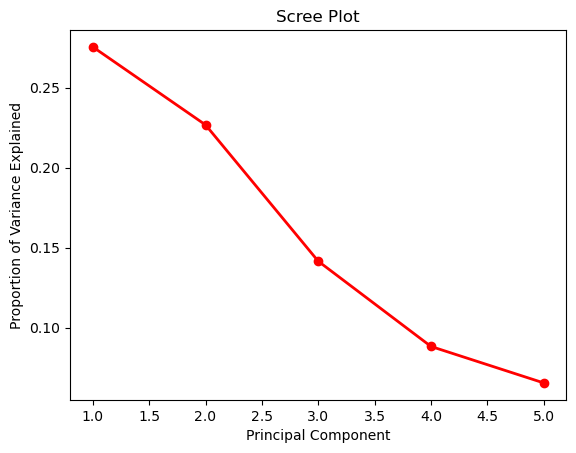

In [36]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

#### We will select four principal components since it capture 73% of variance. The fifth component doesn't improve the variance by much.

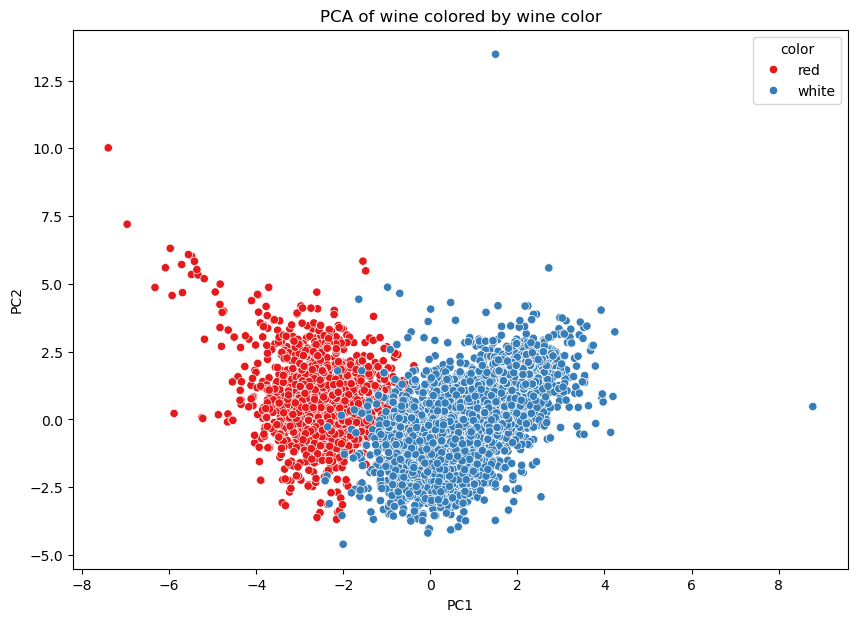

In [37]:
#Final iteration
#Perform PCA
pca=PCA(n_components=4) #Capture 4 components
chemical_pca=pca.fit_transform(chemical_scaled)
#Dataframe with PCA results
pca_df=pd.DataFrame(data=chemical_pca,columns=['PC1','PC2','PC3','PC4'])
pca_df['color']=labels #Add color & quality back to pca dataframe
pca_df['quality']=quality
#Ploting PCA
plt.figure(figsize=(10,7))
sns.scatterplot(x='PC1',y='PC2',hue='color',data=pca_df,palette='Set1')
plt.title("PCA of wine colored by wine color")
plt.show()

In [38]:
pca_loadings = pd.DataFrame(pca.components_.T * np.sqrt(pca.explained_variance_), columns=["PC1", "PC2","PC3","PC4"])
pca_loadings.index = chemical.columns
display(pca_loadings)

,PC1,PC2,PC3,PC4
fixed.acidity,-0.415698,0.531207,0.541848,-0.161921
volatile.acidity,-0.662817,0.185647,-0.383347,-0.209645
citric.acid,0.265276,0.289486,0.736814,0.260400
residual.sugar,0.602172,0.521036,-0.205471,-0.164972
chlorides,-0.505024,0.497889,-0.020809,0.241132
free.sulfur.dioxide,0.750129,0.113604,-0.167462,0.352006
total.sulfur.dioxide,0.848490,0.137820,-0.134073,0.205344
density,-0.078225,0.922374,-0.219091,-0.071652
pH,-0.380686,-0.246165,-0.568077,0.408433
sulphates,-0.512026,0.302778,0.087387,0.631083


<Axes: >

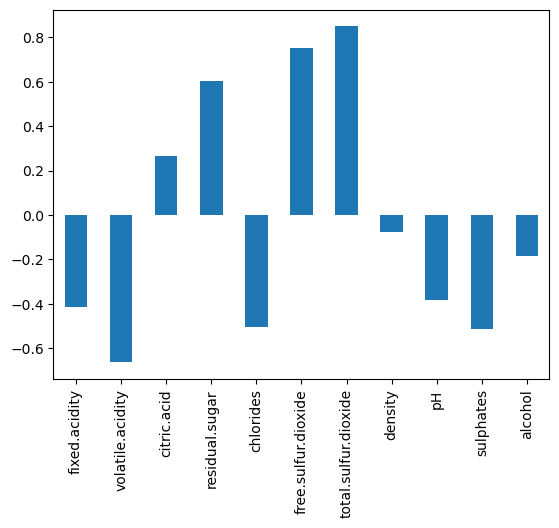

In [39]:
pca_loadings['PC1'].plot(kind='bar')

#### PC1-Sweetness vs. Acidity Balance:
PC1 seems to be capturing a balance between the preservative content in the wine (sulfur dioxide and residual sugar) versus the components contributing to a wine’s acidity and bitterness (volatile acidity, chlorides, fixed acidity, and sulphates). Wines with higher sulfur dioxide and residual sugar levels will have higher PC1 scores, while those with higher acidity and bitterness components will have lower PC1 scores. This component might distinguish wines that are more stable and sweet from those that are more acidic and potentially harsher.

<Axes: >

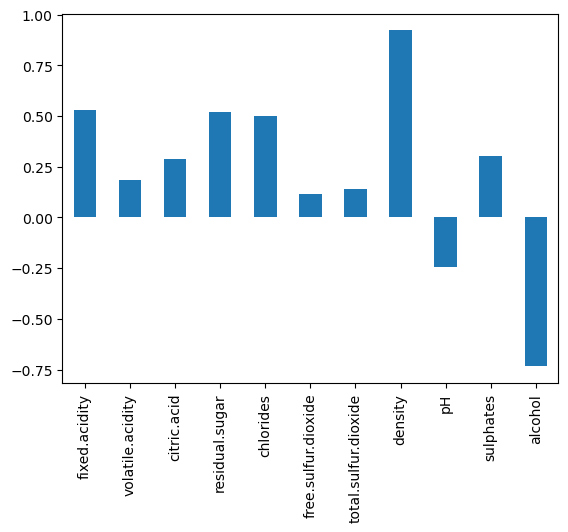

In [40]:
pca_loadings['PC2'].plot(kind='bar')

#### PC2-Body vs. Alcohol Content:
PC2 represents a contrast between the wine’s density and sugar content versus its alcohol content. Wines with high PC2 scores likely have higher density and residual sugar, often associated with sweeter wines or those with more body, whereas wines with lower PC2 scores have higher alcohol content, which is often associated with drier, lighter wines. This component might distinguish heavier, possibly sweeter wines from lighter, drier ones.

<Axes: >

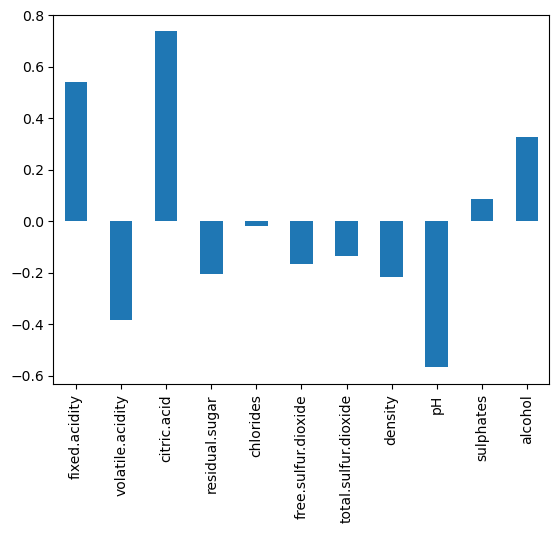

In [41]:
pca_loadings['PC3'].plot(kind='bar')

#### PC3-Acid Balance:
PC3 is capturing a balance between different types of acids in the wine. Citric acid and fixed acidity contribute positively to this component, while volatile acidity and pH contribute negatively. Wines with higher PC3 scores likely have higher levels of stable acids, like citric acid, and lower volatile acidity and pH, indicating wines that are more balanced in their acidity. Lower PC3 scores could indicate wines with higher volatile acidity and a higher pH, possibly indicating a less sharp taste.

<Axes: >

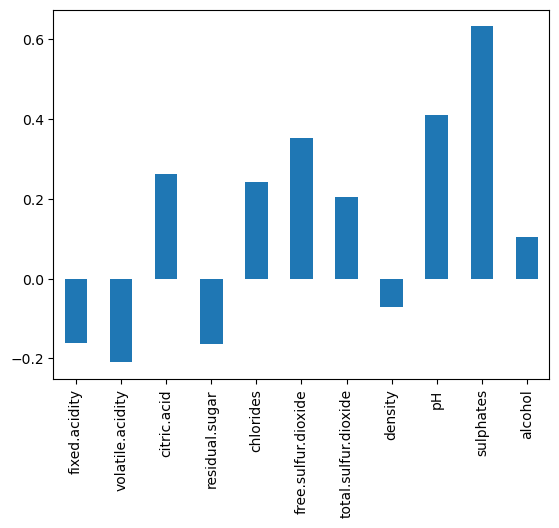

In [42]:
pca_loadings['PC4'].plot(kind='bar')

#### PC4-Preservation and Freshness:
PC4 seems to be differentiating wines based on their preservation and stability characteristics versus their sharpness and freshness. Higher PC4 scores correspond to wines with higher sulfate content, higher pH, and higher sulfur dioxide levels, suggesting that these wines might be more stable and less prone to oxidation. Lower PC4 scores, on the other hand, might correspond to wines that are fresher or have higher volatile acidity, giving them a sharper taste.

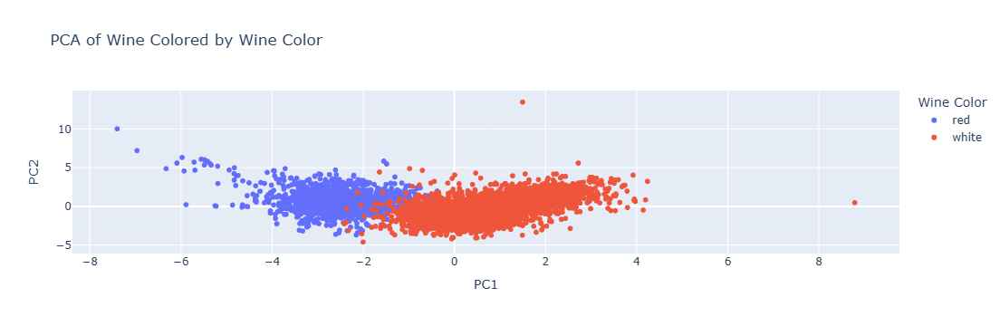

In [43]:
# Create the plotly scatter plot to hover and understand the group
fig = px.scatter(
    pca_df, 
    x='PC1', 
    y='PC2', 
    color='color', 
    hover_data=pca_df.columns,  # Show all columns when hovering
    title="PCA of Wine Colored by Wine Color",
    labels={'color': 'Wine Color'}
)

# Show the plot
fig.show()

#### Let's see PCA vs. Quality

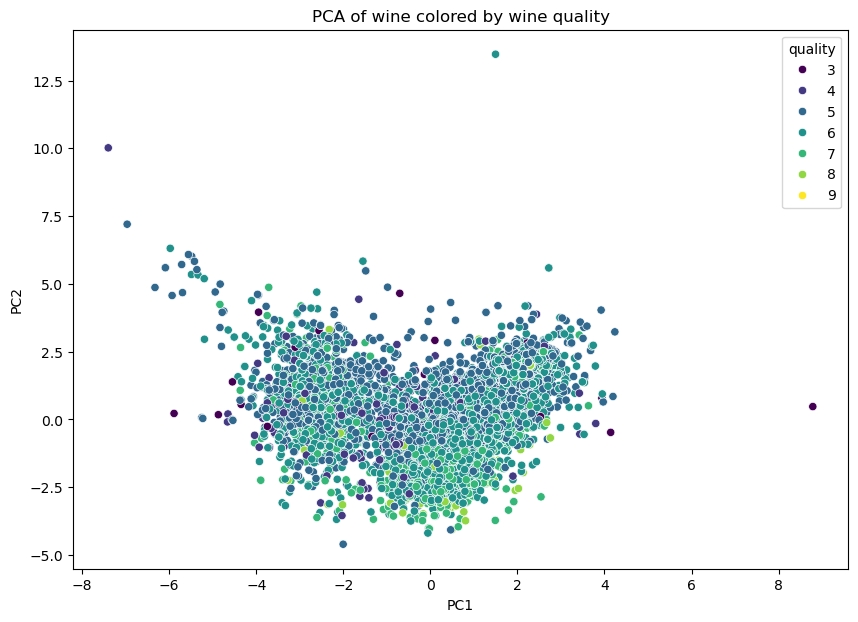

In [44]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='PC1',y='PC2',hue='quality',data=pca_df,palette='viridis')
plt.title("PCA of wine colored by wine quality")
plt.show()

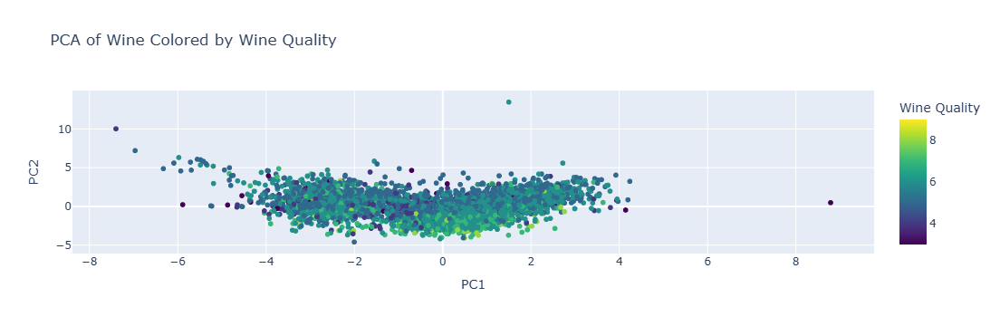

In [45]:
# Create the plotly scatter plot
fig = px.scatter(
    pca_df, 
    x='PC1', 
    y='PC2', 
    color='quality',  # Color by wine quality
    hover_data=pca_df.columns,  # Show all columns when hovering
    title="PCA of Wine Colored by Wine Quality",
    labels={'quality': 'Wine Quality'},  # Label for the color legend
    color_continuous_scale='Viridis'  # Use the Viridis color palette
)

# Show the plot
fig.show()

#### Using tSNE to capture non-linear realtionships

In [46]:
from sklearn.manifold import TSNE

In [47]:
#Perform tSNE
tsne=TSNE(n_components=2,random_state=42)
x_tsne=tsne.fit_transform(chemical_scaled)

In [62]:
#Create a Dataframe with tSNE 
tsne_df=pd.DataFrame(data=x_tsne,columns=['TSNE1','TSNE2'])
tsne_df['color']=labels
tsne_df['quality']=quality
tsne_df

,TSNE1,TSNE2,color,quality
0,-76.951897,-2.807838,red,5
1,-74.996696,9.224433,red,5
2,-74.384491,9.413972,red,5
3,-59.402363,49.558704,red,6
4,-76.951767,-2.806930,red,5
...,...,...,...,...
6492,-18.237902,-43.073292,white,6
6493,26.398891,33.336750,white,5
6494,-10.044542,14.242876,white,6
6495,-15.846848,-67.935654,white,7


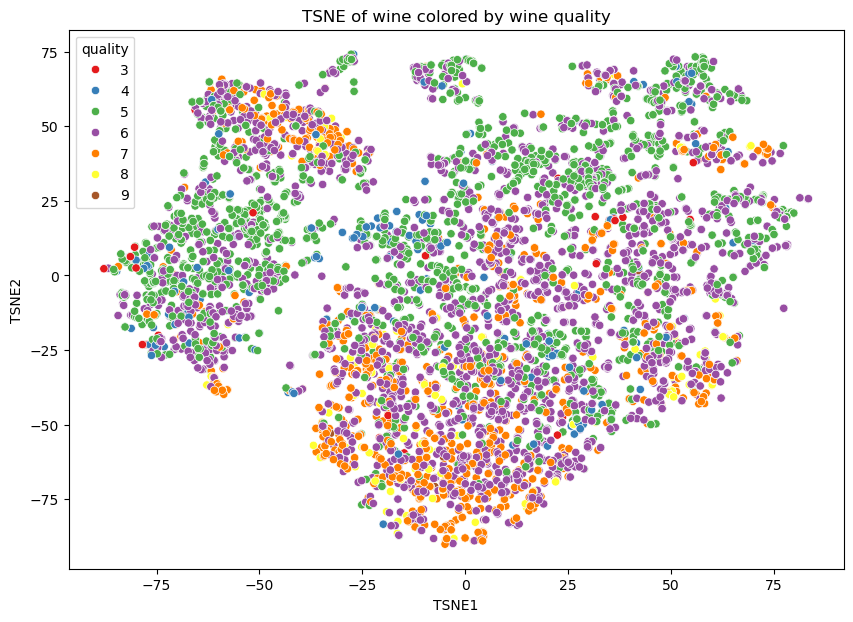

In [49]:
#Plot tsne components
plt.figure(figsize=(10,7))
sns.scatterplot(x='TSNE1',y='TSNE2',hue='quality',data=tsne_df,palette='Set1')
plt.title("TSNE of wine colored by wine quality")
plt.show()

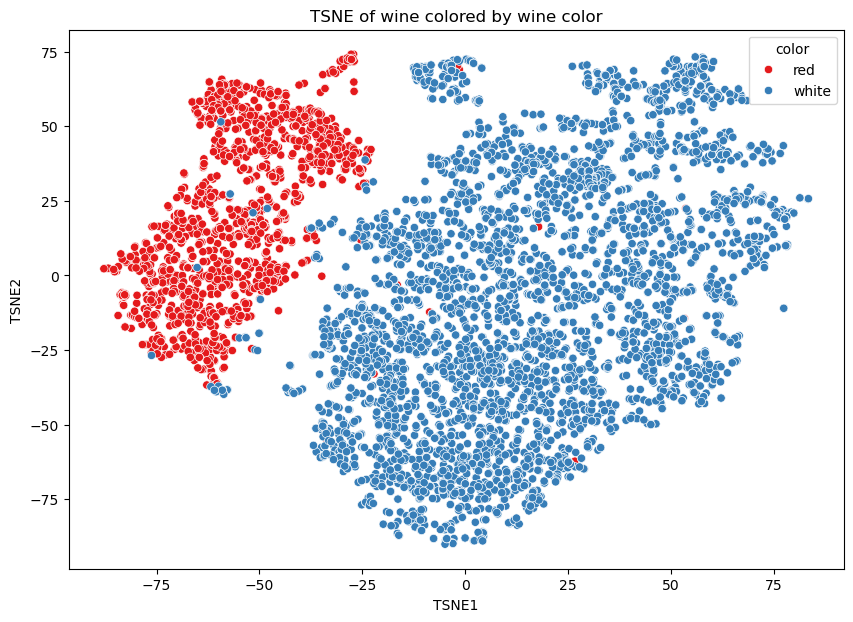

In [50]:
#Plot tsne components
plt.figure(figsize=(10,7))
sns.scatterplot(x='TSNE1',y='TSNE2',hue='color',data=tsne_df,palette='Set1')
plt.title("TSNE of wine colored by wine color")
plt.show()

#### tSNE is able to create better clusters on type of wine

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

C:\Users\grees\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and

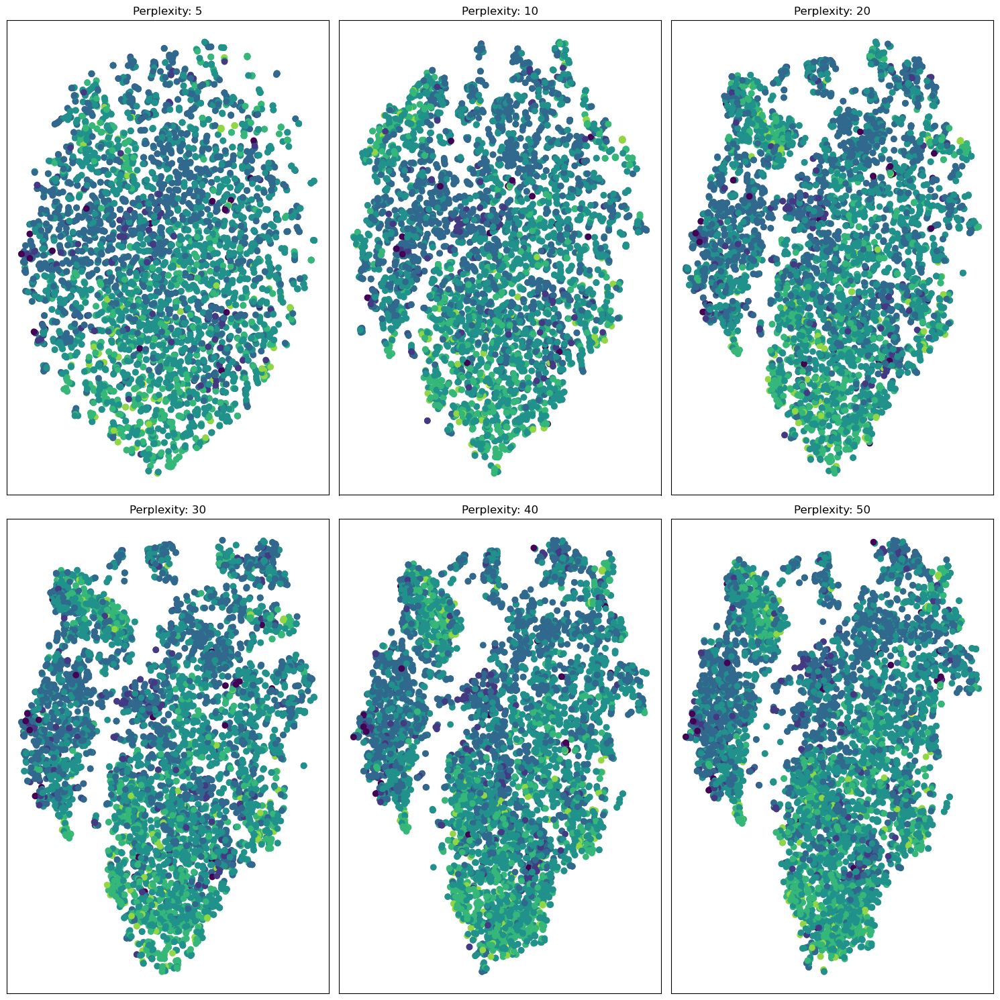

CPU times: total: 4min 44s
Wall time: 9min 13s


In [52]:
%%time
# Varying the perplexity parameter

# define perplexity values to use
perplexities = [ 5, 10, 20, 30, 40, 50]

# create a 3x3 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(15,15))

# reshape axs to 1D array
axs = axs.flatten()

for i, perplexity in enumerate(perplexities):
    # run t-SNE with the specified perplexity
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=1000, learning_rate=200)
    tsne_results = tsne.fit_transform(chemical_scaled)
    
    # convert the t-SNE results to a pandas DataFrame
    tsne_df = pd.DataFrame(data = tsne_results, columns = ['Dim1', 'Dim2'])

    # add the categories to this DataFrame
    tsne_df['Category'] = wine['quality'].values

    # create a scatter plot in the corresponding subplot
    scatter = axs[i].scatter(tsne_df['Dim1'], tsne_df['Dim2'], c=tsne_df['Category'], cmap='viridis')
    axs[i].set_title(f'Perplexity: {perplexity}')
    axs[i].set_xticks([])
    axs[i].set_yticks([])

# show the plot
plt.tight_layout()
plt.show()

#### Perplexity of 50 can distribute the clusters compared to others

### Clustering

In [53]:
from sklearn.cluster import KMeans

Optimal number of clusters based on Gap statistic: 3


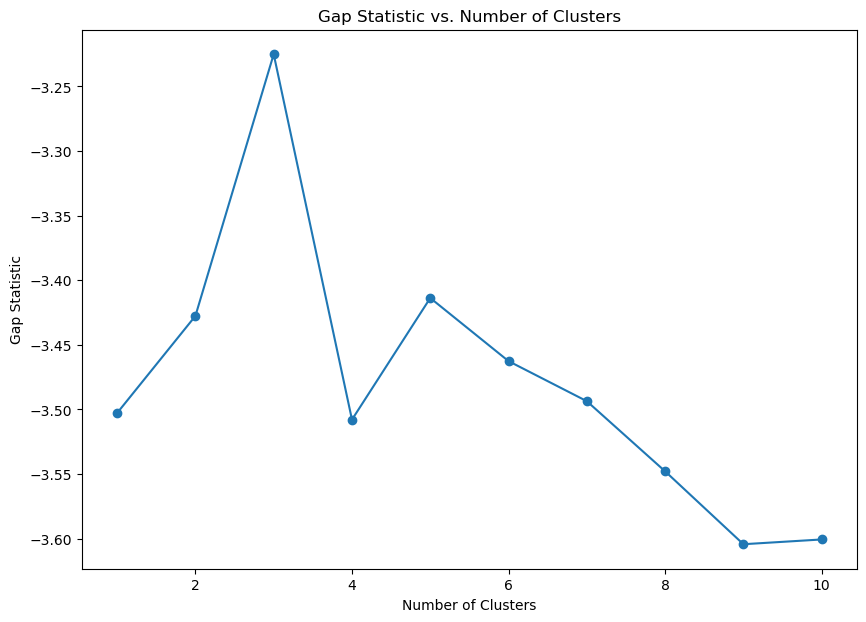

In [54]:
def compute_gap_statistic(X, n_refs=20, max_clusters=10):
    gaps = np.zeros(max_clusters)
    std_devs = np.zeros(max_clusters)
    reference_inertia = np.zeros(max_clusters)
    
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        actual_inertia = kmeans.inertia_
        
        refs = np.zeros(n_refs)
        for i in range(n_refs):
            random_data = np.random.random_sample(size=X.shape)
            kmeans_ref = KMeans(n_clusters=k, random_state=42)
            kmeans_ref.fit(random_data)
            refs[i] = kmeans_ref.inertia_
        
        reference_inertia[k-1] = np.mean(refs)
        gaps[k-1] = np.log(reference_inertia[k-1]) - np.log(actual_inertia)
        std_devs[k-1] = np.std(np.log(refs)) * np.sqrt(1 + 1 / n_refs)
    
    optimal_k = np.argmax(gaps[:-1] - gaps[1:] + std_devs[1:]) + 1
    
    return gaps, optimal_k

# Assuming pca_df contains your PCA-reduced data
data = pca_df[['PC1', 'PC2']].values

# Compute the Gap statistic
gaps, optimal_k = compute_gap_statistic(data, n_refs=20, max_clusters=10)

# Print the optimal number of clusters
print(f'Optimal number of clusters based on Gap statistic: {optimal_k}')

# Plot the Gap statistic
plt.figure(figsize=(10, 7))
plt.plot(range(1, len(gaps) + 1), gaps, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Gap Statistic')
plt.title('Gap Statistic vs. Number of Clusters')
plt.show()



#### The optimal number of clusters according to Gap statistic is 3. We will use it in clustering.

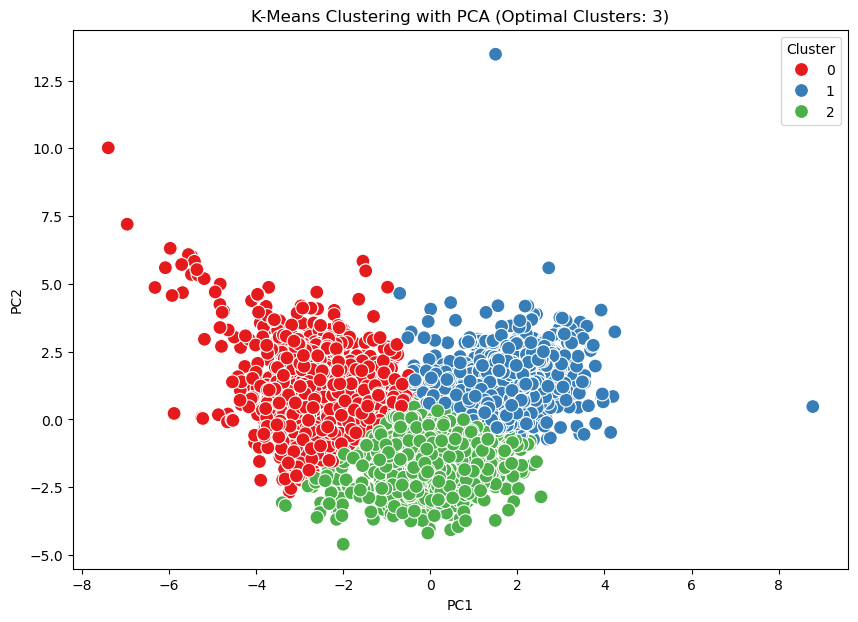

In [55]:
# Perform K-Means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=12)
kmeans.fit(data)

# Add the cluster labels to the DataFrame
pca_df['Cluster'] = kmeans.labels_

# Visualize the Clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100)
plt.title(f'K-Means Clustering with PCA (Optimal Clusters: {optimal_k})')
plt.show()

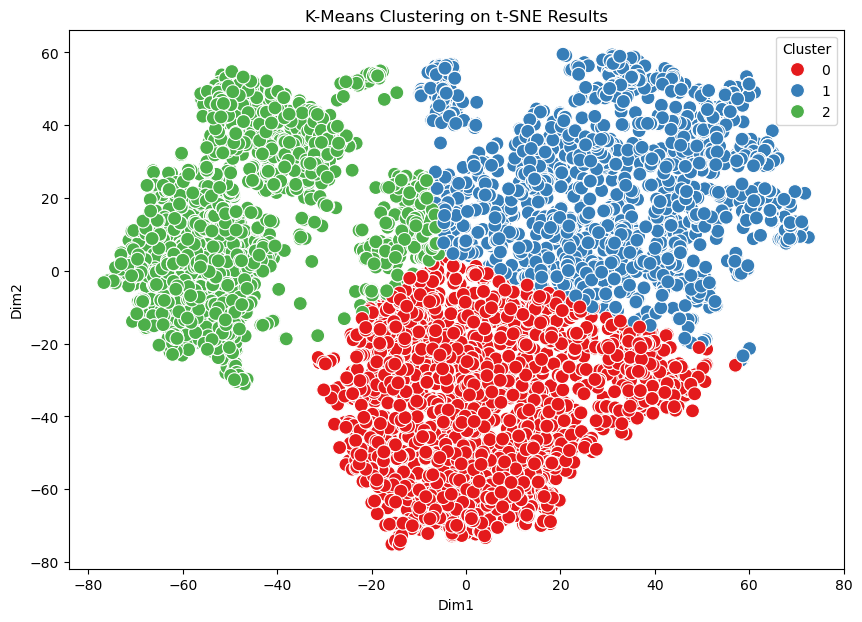

In [64]:
# t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=50, random_state=12)
x_tsne = tsne.fit_transform(chemical_scaled)

#Create a Dataframe with tSNE 
tsne_df=pd.DataFrame(data=x_tsne,columns=['Dim1','Dim2'])
tsne_df['color']=labels
tsne_df['quality']=quality

# K-Means Clustering on the t-SNE results
kmeans = KMeans(n_clusters=3, random_state=42)  # Change n_clusters as needed
kmeans.fit(tsne_df[['Dim1','Dim2']])

# Add the cluster labels to the DataFrame
tsne_df['Cluster'] = kmeans.labels_

# Visualize the Clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='Dim1', y='Dim2', hue='Cluster', data=tsne_df, palette='Set1', s=100)
plt.title("K-Means Clustering on t-SNE Results")
plt.show()

In [66]:
# cross tab of 'color' and 'Cluster'
crosstab_result = pd.crosstab(pca_df['color'], pca_df['Cluster'])

# Print Crosstab
print(crosstab_result)

Cluster     0     1     2
color                    
red      1521     5    73
white      63  1933  2902


#### The Cluster 0 is capturing Red wines and Cluster 1 & 2 captures White wine

In [65]:
# cross tab of 'color' and 'Cluster'
crosstab_result = pd.crosstab(tsne_df['color'], tsne_df['Cluster'])

# Print Crosstab
print(crosstab_result)

Cluster     0     1     2
color                    
red        12     7  1580
white    2411  2193   294


#### Using tSNE White wine is in Clusters 0 & 1 whereas Red wine in 2

In [67]:
# cross tab of 'quality' and 'Cluster'
crosstab_result = pd.crosstab(pca_df['quality'], pca_df['Cluster'])

# Print Crosstab
print(crosstab_result)

Cluster    0    1     2
quality                
3         10   12     8
4         69   41   106
5        691  829   618
6        616  863  1357
7        182  164   733
8         16   28   149
9          0    1     4


In [68]:
# cross tab of 'quality' and 'Cluster'
crosstab_result = pd.crosstab(tsne_df['quality'], tsne_df['Cluster'])

# Print Crosstab
print(crosstab_result)

Cluster     0    1    2
quality                
3           7   11   12
4          59   55  102
5         391  918  829
6        1144  991  701
7         677  192  210
8         141   32   20
9           4    1    0


#### Using both tSNE and PCA quality has a lot of misclassification. The quality is mostly concentrated around 5,6,7 ratings. More features can be explored to understand what drives quality. And more clustering techniques can be used.